<a href="https://www.kaggle.com/code/alejandrolpezmoreira/olist-e-commerce-data-analysis-sql-python?scriptVersionId=268995465" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Intro

![**Olist E-Commerce Data Analysis (SQL + Python)**](https://play-lh.googleusercontent.com/eqLTXWdyygKUf85JsCXmcLSr1GnoYNLJfFVCmY-N8xGFr2T3PWwNcFdJ2Sx7MwcO6ac)

Olist Website: https://olist.com/home/

> *"The data I'll analyze comes from Olist, a Brazilian e-commerce platform that connects small businesses to larger product marketplaces. Olist published a dataset containing 99441 orders from March 2016 to August 2018."*

["E-commerce dataset by Olist (SQLite)"](https://www.kaggle.com/code/terencicp/sql-challenge-e-commerce-data-analysis)

[By Terenci Claramunt](https://www.kaggle.com/terencicp)

The SQL queries in this analysis will focus on key business insights, such as sales trends, top products, and customer behavior. Each query is paired with visualizations to make the results clear, actionable, and easy to interpret.

### Plan

- **Data Cleaning and Preprocessing:** Merge necessary tables (e.g., orders, customers, order_items) and perform data type conversions, especially for date/time columns.

- **KPI Analysis:** Calculate and visualize core Key Performance Indicators (KPIs) like Total Orders, Total Revenue, and Average Order Value (AOV).

- **Sales Trend Analysis:** Analyze sales and order volume over time to identify monthly/quarterly trends and seasonality.

- **Product Performance Analysis:** Identify the top 10 best-selling product categories by order volume and total revenue.

- **Customer Behavior and Geography:** Analyze customer distribution across Brazilian states and cities using the geolocation and customers tables.

- **Shipping and Logistics Analysis:** Evaluate delivery performance by comparing estimated vs. actual delivery times and analyzing internal handling and shipping times.

- **Customer Satisfaction Analysis:** Analyze the order_reviews table to determine average review scores, and identify product categories or sellers associated with the highest/lowest scores.

# Importing Data

In [1]:
!pip install ipython-sql -q
!pip install sqlalchemy pandas -q

In [2]:
# Request Packages
import requests

# Dataframe Packages
import pandas as pd
import numpy as np

# SQL Packages
import sqlite3
from sqlalchemy import create_engine

# Visualization Packages
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium.plugins import MarkerCluster

In [3]:
db_path = "/kaggle/input/e-commerce-dataset-by-olist-as-an-sqlite-database/olist.sqlite"

In [4]:
engine = create_engine(f"sqlite:///{db_path}")

In [5]:
tables = pd.read_sql("SELECT name FROM sqlite_master WHERE type='table';", engine)
print(tables)

                                 name
0   product_category_name_translation
1                             sellers
2                           customers
3                         geolocation
4                         order_items
5                      order_payments
6                       order_reviews
7                              orders
8                            products
9                     leads_qualified
10                       leads_closed


# Functions

* ### Run Querries Function

In [6]:
def run_query(query):
    df = pd.read_sql(query, engine)
    print(f"✅ Query executed successfully! Rows: {len(df)}, Columns: {len(df.columns)}")
    return df

* ### Full-Naming Brazil States Funtion

In [7]:
brazil_states_dict = {
"AC": "Acre",
"AL": "Alagoas",
"AP": "Amapá",
"AM": "Amazonas",
"BA": "Bahia",
"CE": "Ceará",
"DF": "Distrito Federal",
"ES": "Espírito Santo",
"GO": "Goiás",
"MA": "Maranhão",
"MT": "Mato Grosso",
"MS": "Mato Grosso do Sul",
"MG": "Minas Gerais",
"PA": "Pará",
"PB": "Paraíba",
"PR": "Paraná",
"PE": "Pernambuco",
"PI": "Piauí",
"RJ": "Rio de Janeiro",
"RN": "Rio Grande do Norte",
"RS": "Rio Grande do Sul",
"RO": "Rondônia",
"RR": "Roraima",
"SC": "Santa Catarina",
"SE": "Sergipe",
"SP": "São Paulo",
"TO": "Tocantins",
}

def full_naming_states(states):
    df[states] = df[states].map(brazil_states_dict)
    return df.head(5)

* ### Titling Names Funtion

In [8]:
def titling(names):
    df[names] = df[names].map(str.title)
    df[names] = df[names].str.replace("_", " ")
    return df.head(5)

![](http://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F2473556%2F23a7d4d8cd99e36e32e57303eb804fff%2Fdb-schema.png?generation=1714391550829633&alt=media)

# 1. KPI Queries

## Q1.1: "How Many Orders Have Been?"

In [9]:
q11 = """
SELECT
    COUNT(order_items.order_id) AS total_orders
FROM
    order_items
"""

In [10]:
df = run_query(q11)

✅ Query executed successfully! Rows: 1, Columns: 1


In [11]:
total_orders = df['total_orders'].iloc[0]

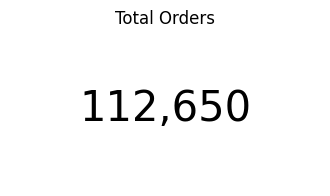

In [12]:
fig, ax = plt.subplots(figsize=(4,2))
ax.text(0.5, 0.5, f"{total_orders:,}", fontsize=30, ha='center', va='center')
ax.axis('off')  # hide axes
plt.title("Total Orders")
plt.show()

## Q1.2: "How Much Revenue Has Been?"

In [13]:
q= """
SELECT DISTINCT
    *
FROM
    order_payments
"""

In [14]:
df = run_query(q)

✅ Query executed successfully! Rows: 103886, Columns: 5


In [15]:
q121 = """
SELECT
    SUM(order_items.price) AS total_revenue_sales
FROM
    order_items
"""

In [16]:
df = run_query(q121)

✅ Query executed successfully! Rows: 1, Columns: 1


In [17]:
total_revenue_sales = df['total_revenue_sales'].iloc[0]

In [18]:
q122 = """
SELECT
    SUM(oi.freight_value) AS total_freight_value
FROM
    order_items AS oi
"""

In [19]:
df = run_query(q122)

✅ Query executed successfully! Rows: 1, Columns: 1


In [20]:
total_freight_value = df['total_freight_value'].iloc[0]

In [21]:
q123 = """
SELECT
    SUM(op.payment_value) AS total_revenue_payments
FROM
    order_payments AS op
"""

In [22]:
df = run_query(q123)

✅ Query executed successfully! Rows: 1, Columns: 1


In [23]:
total_revenue_payments = df['total_revenue_payments'].iloc[0]

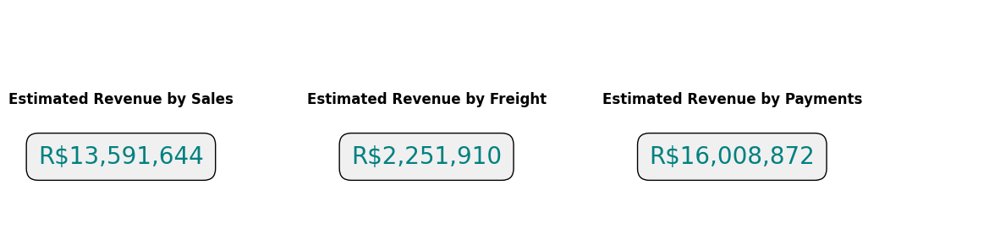

In [24]:
kpis = {
    "Estimated Revenue by Sales": f"R${total_revenue_sales:,.0f}",
    "Estimated Revenue by Freight": f"R${total_freight_value:,.0f}",
    "Estimated Revenue by Payments": f"R${total_revenue_payments:,.0f}",
}

fig, ax = plt.subplots(figsize=(12, 3))
ax.axis("off")

# Layout settings
num_kpis = len(kpis)
for i, (title, value) in enumerate(kpis.items()):
    x_pos = i / num_kpis
    ax.text(x_pos + 0.05, 0.6, title, fontsize=12, fontweight="bold", ha="center", va="center")
    ax.text(x_pos + 0.05, 0.35, value, fontsize=20, color="teal", ha="center", va="center",
            bbox=dict(facecolor="#f0f0f0", boxstyle="round,pad=0.5"))
    
plt.tight_layout()
plt.show()

## Q1.3: "How many Customers did we have?"

In [25]:
q13 = """
SELECT
    COUNT(DISTINCT customer_unique_id) AS number_of_customers
FROM
    customers AS c
"""

In [26]:
df = run_query(q13)

✅ Query executed successfully! Rows: 1, Columns: 1


In [27]:
number_of_customers = df['number_of_customers'].iloc[0]

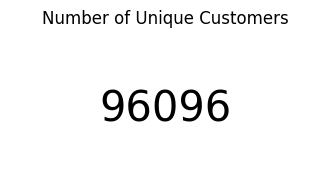

In [28]:
fig, ax = plt.subplots(figsize=(4,2))
ax.text(0.5, 0.5, f"{number_of_customers:}", fontsize=30, ha='center', va='center')
ax.axis('off')  # hide axes
plt.title("Number of Unique Customers")
plt.show()

## Q1.4: "How many Frequent Customers did we have?"

In [29]:
q14 = """
SELECT COUNT(*) AS frequent_customers
FROM (
    SELECT c.customer_unique_id
    FROM customers c
    JOIN orders o ON c.customer_id = o.customer_id
    GROUP BY c.customer_unique_id
    HAVING COUNT(o.order_id) > 1
) AS frequent_customers_subquery;

"""

In [30]:
df = run_query(q14)

✅ Query executed successfully! Rows: 1, Columns: 1


In [31]:
frequent_customers = df['frequent_customers'].iloc[0]

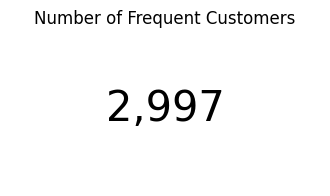

In [32]:
fig, ax = plt.subplots(figsize=(4,2))
ax.text(0.5, 0.5, f"{frequent_customers:,}", fontsize=30, ha='center', va='center')
ax.axis('off')  # hide axes
plt.title("Number of Frequent Customers")
plt.show()

## Q1.5: "Average amount of orders by customer?"

In [33]:
q15 = '''
SELECT
    AVG(orders_by_customer) AS overall_avg_orders
FROM (
    SELECT 
        c.customer_unique_id,
        COUNT(o.order_id) AS orders_by_customer
    FROM customers c
    JOIN orders o ON c.customer_id = o.customer_id
    GROUP BY c.customer_unique_id
) AS orders_by_customer_subquery
'''

In [34]:
df= run_query(q15)

✅ Query executed successfully! Rows: 1, Columns: 1


In [35]:
overall_avg_orders = df['overall_avg_orders'].iloc[0]

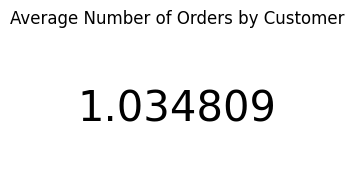

In [36]:
fig, ax = plt.subplots(figsize=(4,2))
ax.text(0.5, 0.5, f"{overall_avg_orders:2F}", fontsize=30, ha='center', va='center')
ax.axis('off')  # hide axes
plt.title("Average Number of Orders by Customer")
plt.show()

## Q1.6: "Average amount spent by customer?"

In [37]:
q16 = '''
SELECT 
    AVG(amount_paid_by_customer) AS overall_avg_payment
FROM (
    SELECT 
        c.customer_unique_id,
        SUM(op.payment_value) AS amount_paid_by_customer
    FROM customers c
    JOIN orders o ON c.customer_id = o.customer_id
    JOIN order_payments op ON o.order_id = op.order_id
    GROUP BY c.customer_unique_id
) AS payment_by_customer_subquery;
'''

In [38]:
df = run_query(q16)

✅ Query executed successfully! Rows: 1, Columns: 1


In [39]:
overall_avg_payment = df['overall_avg_payment'].iloc[0]

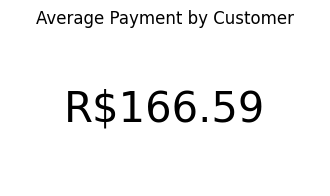

In [40]:
fig, ax = plt.subplots(figsize=(4,2))
ax.text(0.5, 0.5, f"R${overall_avg_payment:,.2F}", fontsize=30, ha='center', va='center')
ax.axis('off')  # hide axes
plt.title("Average Payment by Customer")
plt.show()

# 2. Ranking / Top-N Queries

## Q2.1: "The 10 Most Demanded Product Categories"

In [41]:
q21 = """
SELECT 
    t.product_category_name_english AS product_category_name,
    COUNT(oi.order_id) AS total_orders_per_category
FROM 
    order_items AS oi
JOIN 
    products AS p
    ON oi.product_id = p.product_id
JOIN
    product_category_name_translation AS t
    ON p.product_category_name = t.product_category_name
GROUP BY 
    t.product_category_name_english
ORDER BY 
    total_orders_per_category DESC
LIMIT 10;
"""

In [42]:
df = run_query(q21)

✅ Query executed successfully! Rows: 10, Columns: 2


In [43]:
titling('product_category_name')

,product_category_name,total_orders_per_category
0,Bed Bath Table,11115
1,Health Beauty,9670
2,Sports Leisure,8641
3,Furniture Decor,8334
4,Computers Accessories,7827


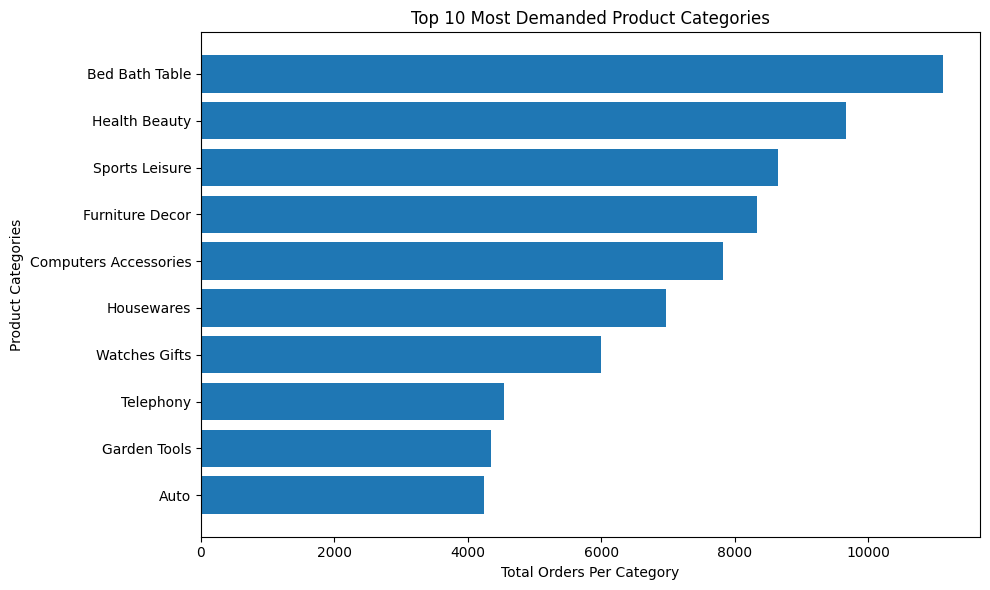

In [44]:
plt.figure(figsize=(10, 6))
plt.barh(df["product_category_name"], df["total_orders_per_category"])
plt.xlabel("Total Orders Per Category")
plt.ylabel("Product Categories")
plt.title("Top 10 Most Demanded Product Categories")
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()

## Q2.2: "The 10th Items That Generated The Most Revenue"

In [45]:
q22 = """
SELECT 
    t.product_category_name_english AS product_category_name,
    SUM(oi.price) AS total_revenue_per_category
FROM 
    order_items AS oi
JOIN 
    products AS p
    ON oi.product_id = p.product_id
JOIN
    product_category_name_translation AS t
    ON p.product_category_name = t.product_category_name
GROUP BY 
    t.product_category_name_english
ORDER BY 
    total_revenue_per_category DESC
LIMIT 10;
"""

In [46]:
df = run_query(q22)

✅ Query executed successfully! Rows: 10, Columns: 2


In [47]:
titling('product_category_name')

,product_category_name,total_revenue_per_category
0,Health Beauty,1258681.34
1,Watches Gifts,1205005.68
2,Bed Bath Table,1036988.68
3,Sports Leisure,988048.97
4,Computers Accessories,911954.32


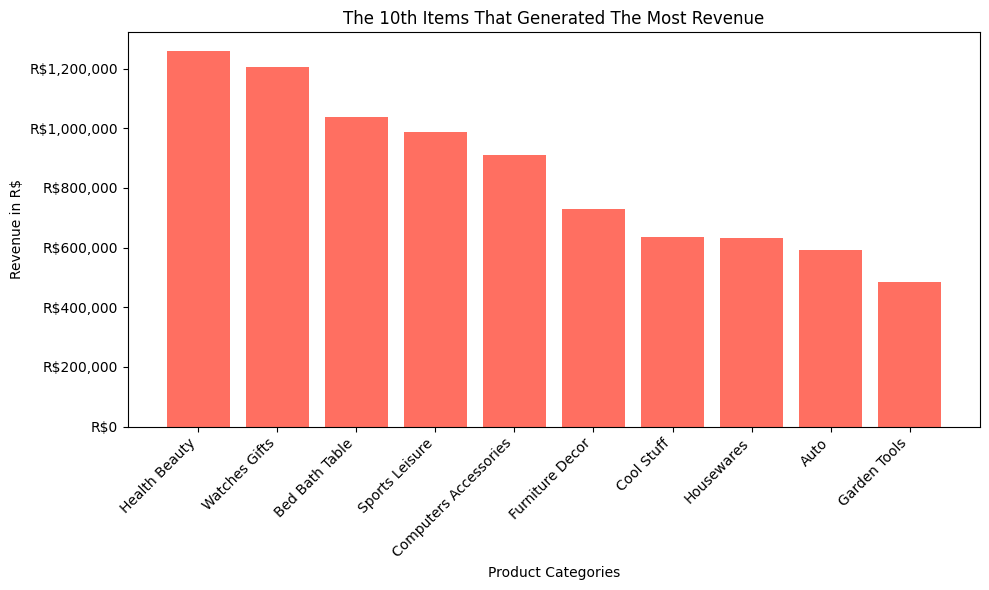

In [48]:
plt.figure(figsize=(10, 6))
plt.bar(df["product_category_name"], df["total_revenue_per_category"], color="#FF6F61")
plt.xlabel("Product Categories")
plt.ylabel("Revenue in R$")
plt.title("The 10th Items That Generated The Most Revenue")
plt.xticks(rotation=45, ha='right')

plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter("R${x:,.0f}"))

plt.tight_layout()
plt.show()

## Q2.3: "Top 10 States where most Customers are? (by R$)"

In [49]:
q23 = '''
SELECT 
    c.customer_state,
    SUM(op.payment_value) AS total_sales
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
JOIN order_payments op ON o.order_id = op.order_id
GROUP BY c.customer_state
ORDER BY total_sales DESC
LIMIT 10;
'''

In [50]:
df = run_query(q23)

✅ Query executed successfully! Rows: 10, Columns: 2


In [51]:
full_naming_states("customer_state")

,customer_state,total_sales
0,São Paulo,5998226.96
1,Rio de Janeiro,2144379.69
2,Minas Gerais,1872257.26
3,Rio Grande do Sul,890898.54
4,Paraná,811156.38


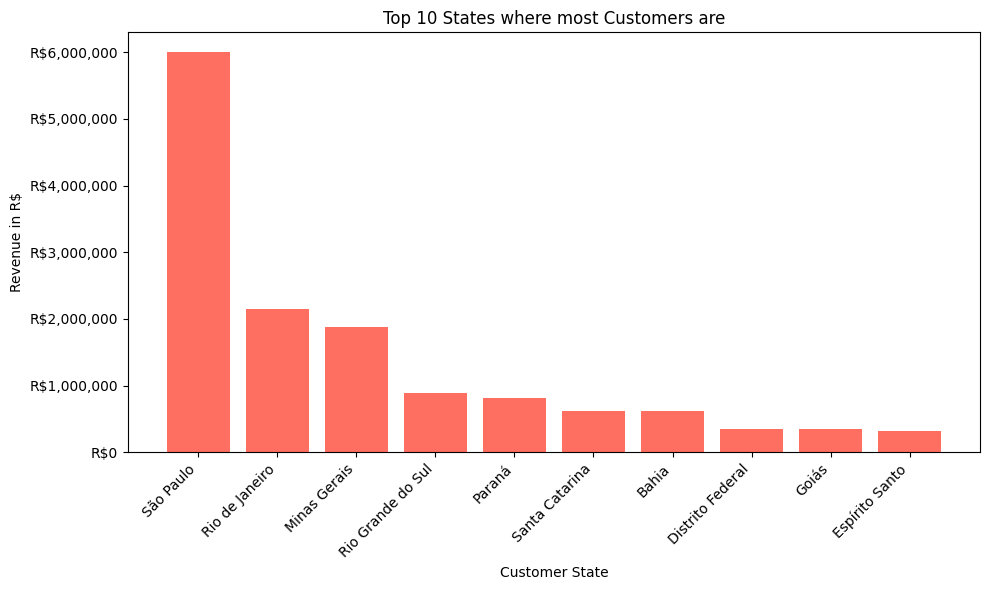

In [52]:
plt.figure(figsize=(10, 6))
plt.bar(df["customer_state"], df["total_sales"], color="#FF6F61")
plt.xlabel("Customer State")
plt.ylabel("Revenue in R$")
plt.title("Top 10 States where most Customers are")
plt.xticks(rotation=45, ha='right')

plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter("R${x:,.0f}"))

plt.tight_layout()
plt.show()

## Q2.4: "Top 10 Cities where most Customers are? (by R$)"

In [53]:
q24 = '''
SELECT 
    c.customer_city,
    SUM(op.payment_value) AS total_sales
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
JOIN order_payments op ON o.order_id = op.order_id
GROUP BY c.customer_city
ORDER BY total_sales DESC
LIMIT 10;
'''

In [54]:
df = run_query(q24)

✅ Query executed successfully! Rows: 10, Columns: 2


In [55]:
titling('customer_city')

,customer_city,total_sales
0,Sao Paulo,2203373.09
1,Rio De Janeiro,1161927.36
2,Belo Horizonte,421765.12
3,Brasilia,354216.78
4,Curitiba,247392.48


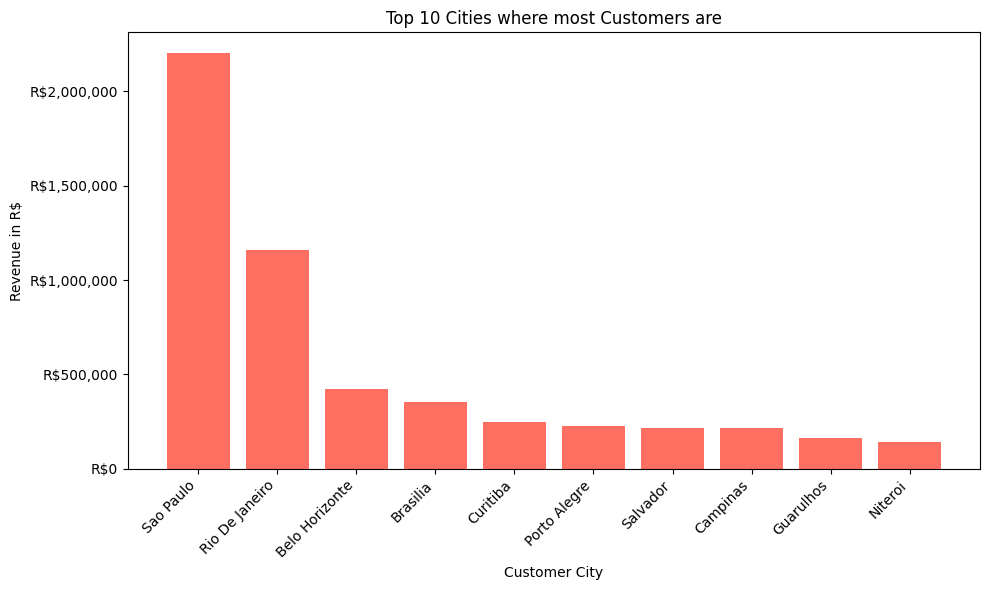

In [56]:
plt.figure(figsize=(10, 6))
plt.bar(df["customer_city"], df["total_sales"], color="#FF6F61")
plt.xlabel("Customer City")
plt.ylabel("Revenue in R$")
plt.title("Top 10 Cities where most Customers are")
plt.xticks(rotation=45, ha='right')

plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter("R${x:,.0f}"))

plt.tight_layout()
plt.show()

## Q2.5: "Top 10 States where most Sellers are? (by R$)"

In [57]:
q25 = '''
SELECT 
    s.seller_state,
    SUM(op.payment_value) AS total_sales
FROM sellers AS s
JOIN order_items oi ON s.seller_id = oi.seller_id
JOIN orders o ON o.order_id = oi.order_id
JOIN order_payments op ON o.order_id = op.order_id
GROUP BY s.seller_state
ORDER BY total_sales DESC
LIMIT 10;
'''

In [58]:
df = run_query(q25)

✅ Query executed successfully! Rows: 10, Columns: 2


In [59]:
full_naming_states("seller_state")

,seller_state,total_sales
0,São Paulo,1.336988e+07
1,Paraná,1.846048e+06
2,Minas Gerais,1.564758e+06
3,Rio de Janeiro,1.098242e+06
4,Santa Catarina,8.867455e+05


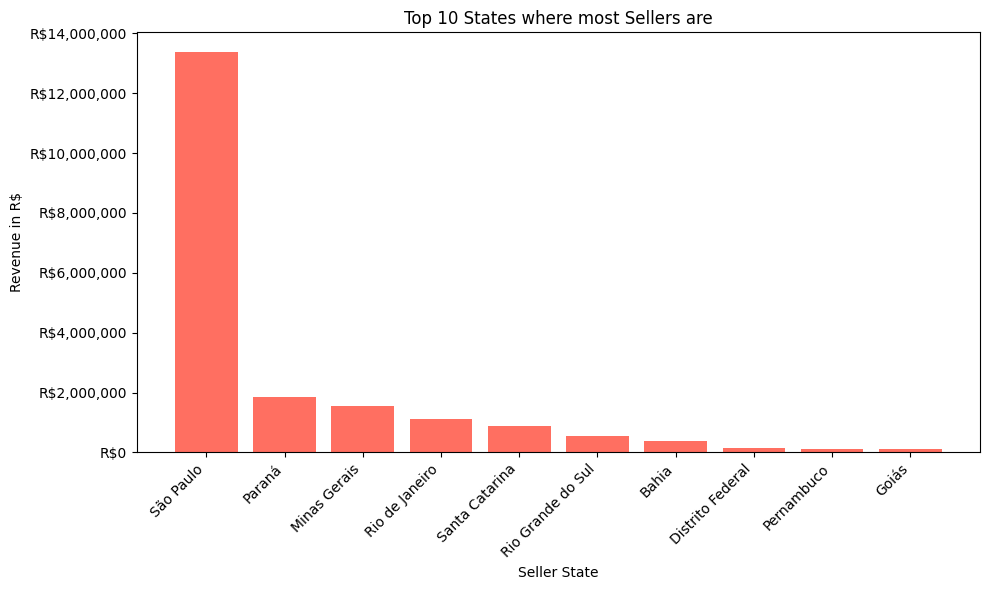

In [60]:
plt.figure(figsize=(10, 6))
plt.bar(df["seller_state"], df["total_sales"], color="#FF6F61")
plt.xlabel("Seller State")
plt.ylabel("Revenue in R$")
plt.title("Top 10 States where most Sellers are")
plt.xticks(rotation=45, ha='right')

plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter("R${x:,.0f}"))

plt.tight_layout()
plt.show()

## Q2.6: "Top 10 Cities where most Sellers are? (by R$)"

In [61]:
q26 = '''
SELECT 
    s.seller_city,
    SUM(op.payment_value) AS total_sales
FROM sellers AS s
JOIN order_items oi ON s.seller_id = oi.seller_id
JOIN orders o ON o.order_id = oi.order_id
JOIN order_payments op ON o.order_id = op.order_id
GROUP BY s.seller_city
ORDER BY total_sales DESC
LIMIT 10;
'''

In [62]:
df = run_query(q26)

✅ Query executed successfully! Rows: 10, Columns: 2


In [63]:
titling('seller_city')

,seller_city,total_sales
0,Sao Paulo,4253442.43
1,Ibitinga,1052674.56
2,Curitiba,655714.44
3,Itaquaquecetuba,573709.15
4,Guarulhos,508846.11


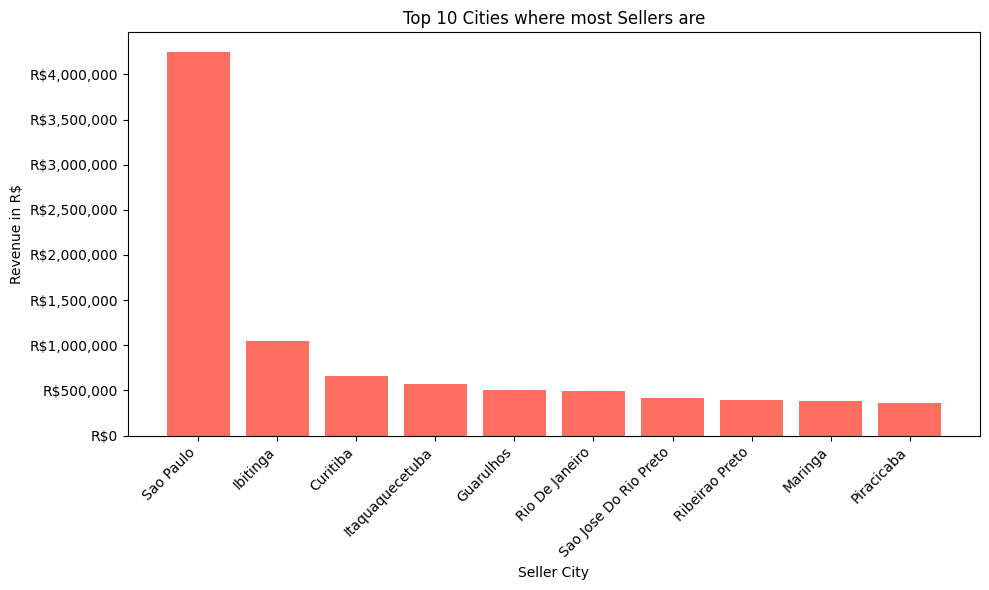

In [64]:
plt.figure(figsize=(10, 6))
plt.bar(df["seller_city"], df["total_sales"], color="#FF6F61")
plt.xlabel("Seller City")
plt.ylabel("Revenue in R$")
plt.title("Top 10 Cities where most Sellers are")
plt.xticks(rotation=45, ha='right')

plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter("R${x:,.0f}"))

plt.tight_layout()
plt.show()

# 3. Mapping with Queries

## Q3.1: "Where are the Customers and Sellers located? (by City)

In [65]:
q31 = '''
WITH unique_geolocation AS (
    SELECT 
        geolocation_zip_code_prefix,
        geolocation_city,
        geolocation_state,
        ROUND(AVG(geolocation_lat), 5) AS lat,
        ROUND(AVG(geolocation_lng), 5) AS lng
    FROM geolocation
    GROUP BY geolocation_zip_code_prefix, geolocation_city, geolocation_state
),
customer_data AS (
    SELECT
        g.geolocation_city AS city,
        g.geolocation_state AS state,
        ROUND(AVG(g.lat), 5) AS lat,
        ROUND(AVG(g.lng), 5) AS lng,
        COUNT(DISTINCT c.customer_id) AS num_customers
    FROM unique_geolocation g
    JOIN customers c
      ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    GROUP BY g.geolocation_city, g.geolocation_state
),
seller_data AS (
    SELECT
        g.geolocation_city AS city,
        g.geolocation_state AS state,
        ROUND(AVG(g.lat), 5) AS lat,
        ROUND(AVG(g.lng), 5) AS lng,
        COUNT(DISTINCT s.seller_id) AS num_sellers
    FROM unique_geolocation g
    JOIN sellers s
      ON s.seller_zip_code_prefix = g.geolocation_zip_code_prefix
    GROUP BY g.geolocation_city, g.geolocation_state
)

-- Simulate FULL OUTER JOIN using UNION of LEFT JOIN + RIGHT JOIN (as LEFT JOIN reversed)
SELECT
    c.city,
    c.state,
    c.lat,
    c.lng,
    c.num_customers,
    COALESCE(s.num_sellers, 0) AS num_sellers
FROM customer_data c
LEFT JOIN seller_data s
  ON c.city = s.city AND c.state = s.state

UNION

SELECT
    s.city,
    s.state,
    s.lat,
    s.lng,
    COALESCE(c.num_customers, 0) AS num_customers,
    s.num_sellers
FROM seller_data s
LEFT JOIN customer_data c
  ON c.city = s.city AND c.state = s.state

ORDER BY num_customers DESC, num_sellers DESC;
'''

In [66]:
df = run_query(q31)

✅ Query executed successfully! Rows: 6497, Columns: 6


In [67]:
df = df.dropna(subset=['lat', 'lng'])
df['num_customers'] = df['num_customers'].astype(int)
df['num_sellers'] = df['num_sellers'].astype(int)

In [68]:
m = folium.Map(location=[-14.235, -51.9253], zoom_start=4)

In [69]:
customer_cluster = MarkerCluster(name='Customers').add_to(m)
seller_cluster = MarkerCluster(name='Sellers').add_to(m)

In [70]:
max_customers = df['num_customers'].max() if not df.empty else 1
max_sellers = df['num_sellers'].max() if not df.empty else 1

In [71]:
# Add customer circles (blue)
for _, row in df.iterrows():
    if row['num_customers'] > 0:
        folium.CircleMarker(
            location=[row['lat'], row['lng']],
            radius=4 + (row['num_customers'] / max_customers) * 18,
            popup=(
                f"<b>{row['city']} ({row['state']})</b><br>"
                f"Customers: {row['num_customers']}<br>"
                f"Sellers: {row['num_sellers']}"
            ),
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.5
        ).add_to(customer_cluster)

# Add seller circles (green)
for _, row in df.iterrows():
    if row['num_sellers'] > 0:
        folium.CircleMarker(
            location=[row['lat'], row['lng']],
            radius=4 + (row['num_sellers'] / max_sellers) * 18,
            popup=(
                f"<b>{row['city']} ({row['state']})</b><br>"
                f"Customers: {row['num_customers']}<br>"
                f"Sellers: {row['num_sellers']}"
            ),
            color='green',
            fill=True,
            fill_color='green',
            fill_opacity=0.5
        ).add_to(seller_cluster)

In [72]:

# Add layer control to toggle between customers/sellers
folium.LayerControl().add_to(m)

In [73]:
# Display map
m

# 4. Distribution / Segmentation Queries

## Q4.1: "Order distribution by status?"

In [74]:
q41 = '''
SELECT
    order_status,
    COUNT(order_id) AS orders_by_status
FROM
    orders
GROUP BY
    order_status
'''

In [75]:
df = run_query(q41)

✅ Query executed successfully! Rows: 8, Columns: 2


In [76]:
titling('order_status')

,order_status,orders_by_status
0,Approved,2
1,Canceled,625
2,Created,5
3,Delivered,96478
4,Invoiced,314


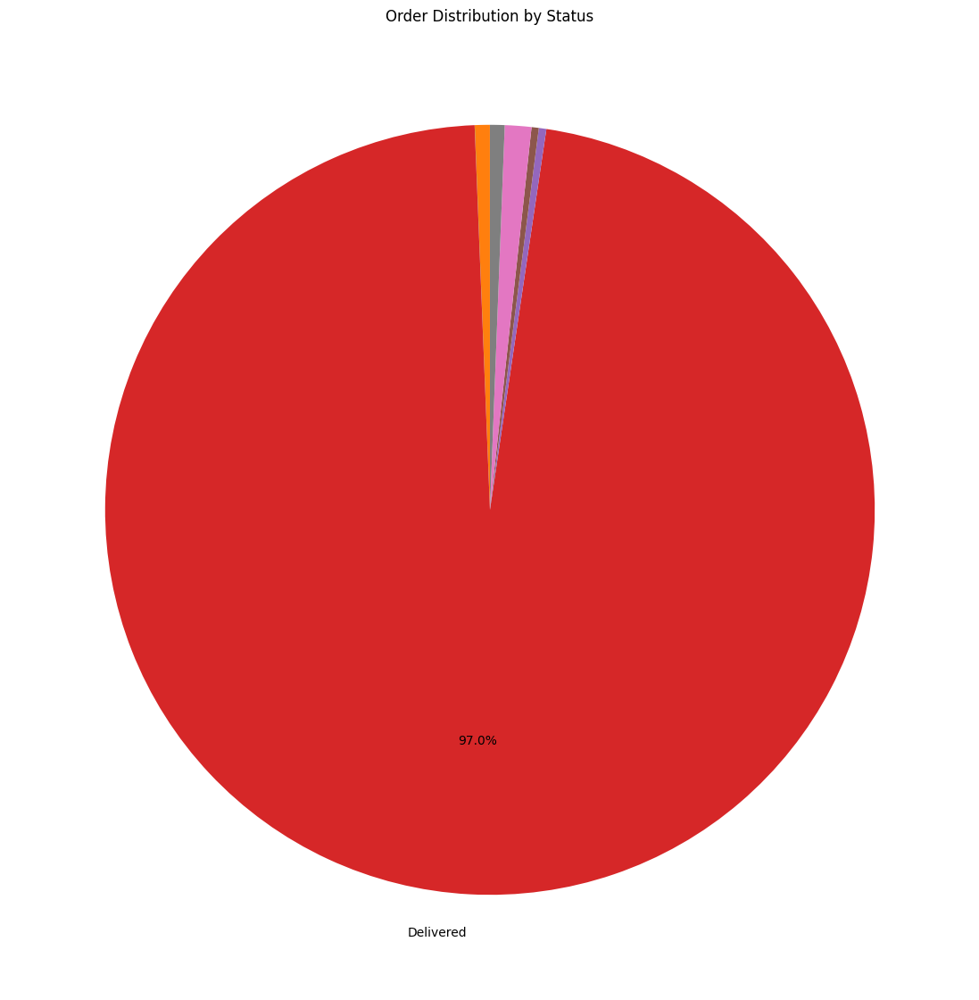

In [77]:
sizes = df['orders_by_status']
labels = df['order_status']

plt.figure(figsize=(14,14))
plt.pie(
    sizes,
    labels=[label if size > sizes.sum()*0.02 else '' for label, size in zip(labels, sizes)],
    autopct=lambda pct: f'{pct:.1f}%' if pct > 2 else '',  # hide tiny % labels
    startangle=90
)
plt.title('Order Distribution by Status')
plt.show()

In [78]:
df_non_delivered = df[df['order_status'] != 'Delivered']

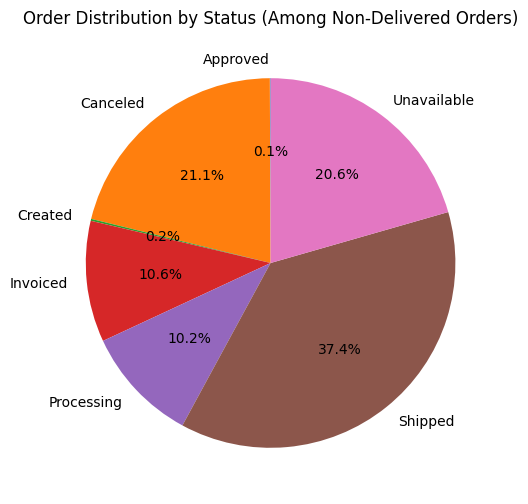

In [79]:
plt.figure(figsize=(6,6))
plt.pie(
    df_non_delivered['orders_by_status'],
    labels=df_non_delivered['order_status'],
    autopct='%1.1f%%',
    startangle=90
)
plt.title('Order Distribution by Status (Among Non-Delivered Orders)')
plt.show()

## Q4.2: "What kind of products are sold by State?"

In [80]:
q42 = '''
SELECT
    c.customer_state AS state,
    pcnt.product_category_name_english AS product_category,
    COUNT(oi.order_id) AS total_items_sold
FROM order_items oi
JOIN orders o
    ON oi.order_id = o.order_id
JOIN customers c
    ON o.customer_id = c.customer_id
JOIN products p
    ON oi.product_id = p.product_id
JOIN product_category_name_translation AS pcnt
    ON p.product_category_name = pcnt.product_category_name
GROUP BY c.customer_state, pcnt.product_category_name_english
ORDER BY total_items_sold DESC;
'''

In [81]:
df = run_query(q42)

✅ Query executed successfully! Rows: 1356, Columns: 3


In [82]:
titling('product_category')

,state,product_category,total_items_sold
0,SP,Bed Bath Table,5235
1,SP,Health Beauty,4204
2,SP,Sports Leisure,3667
3,SP,Furniture Decor,3531
4,SP,Housewares,3265


In [83]:
full_naming_states('state')

,state,product_category,total_items_sold
0,São Paulo,Bed Bath Table,5235
1,São Paulo,Health Beauty,4204
2,São Paulo,Sports Leisure,3667
3,São Paulo,Furniture Decor,3531
4,São Paulo,Housewares,3265


In [84]:
# assuming df has: ['state', 'product_category_grouped', 'total_items_sold']

# Get unique states
states = sorted(df['state'].unique())

# Create an initial figure (for the first state)
initial_state = states[0]
df_initial = df[df['state'] == initial_state].sort_values('total_items_sold', ascending=True)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=df_initial['total_items_sold'],
    y=df_initial['product_category'],
    orientation='h',
    marker=dict(color='skyblue')
))

# Add dropdown buttons for each state
buttons = []
for s in states:
    filtered = df[df['state'] == s].sort_values('total_items_sold', ascending=True)
    buttons.append(
        dict(
            label=s,
            method='update',
            args=[
                {
                    'x': [filtered['total_items_sold']],
                    'y': [filtered['product_category']],
                },
                {'title': f'Product Category Sales in {s}'}
            ]
        )
    )

# Layout updates
fig.update_layout(
    updatemenus=[{
        'buttons': buttons,
        'direction': 'down',
        'x': 1.1,
        'xanchor': 'left',
        'y': 1.05,
        'yanchor': 'top'
    }],
    title=f'Product Category Sales in {initial_state}',
    xaxis_title='Total Items Sold',
    yaxis_title='Product Category',
    height=600,
    margin=dict(l=150, r=40, t=80, b=60),
)

fig.show()

## Q4.3: "Distribution of type of payments? (By Orders)"

In [85]:
q= '''
SELECT *
FROM order_payments;
'''

In [86]:
df = run_query(q)
df

✅ Query executed successfully! Rows: 103886, Columns: 5


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [87]:
q43 = '''
SELECT
    payment_type,
    COUNT(order_id) AS orders_by_type_of_payment
FROM
    order_payments
GROUP BY
    payment_type
'''

In [88]:
df = run_query(q43)

✅ Query executed successfully! Rows: 5, Columns: 2


In [89]:
titling("payment_type")

,payment_type,orders_by_type_of_payment
0,Boleto,19784
1,Credit Card,76795
2,Debit Card,1529
3,Not Defined,3
4,Voucher,5775


In [90]:
df = df[df["payment_type"] != "Not Defined"] # Eliminating "Not Defined for being such an meaningless and very small amount of data"

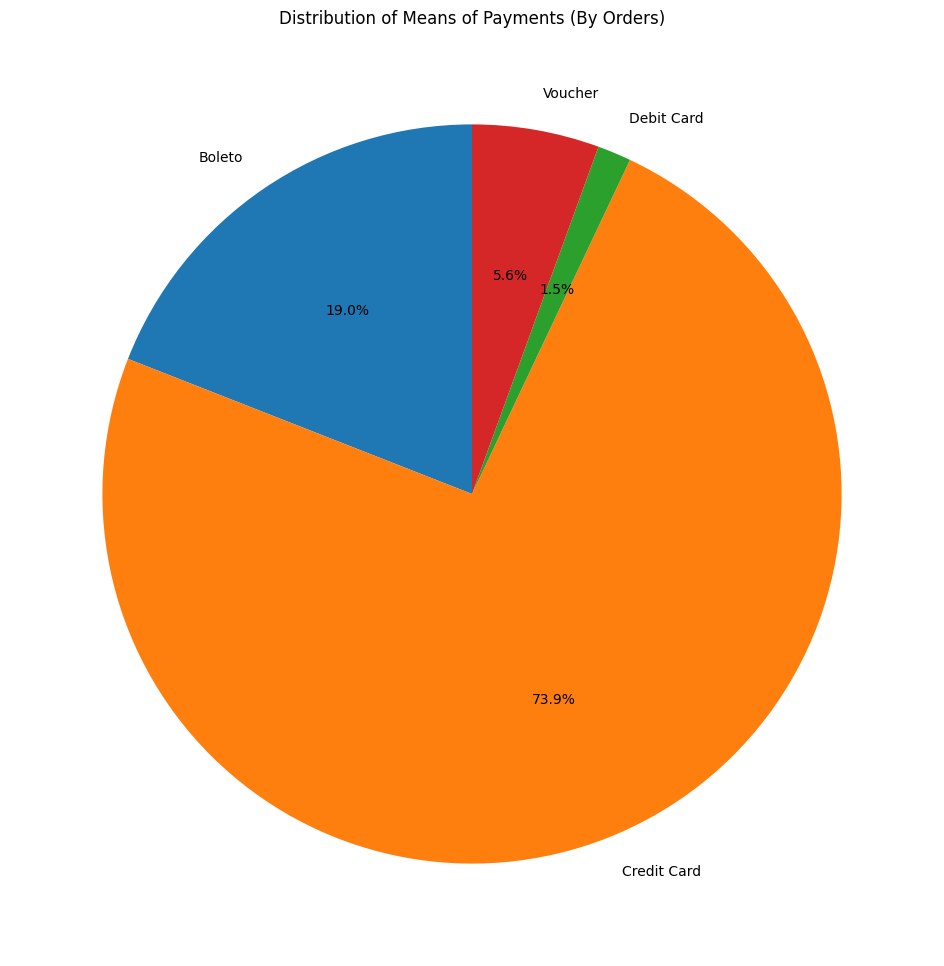

In [91]:
plt.figure(figsize=(12,12))
plt.pie(
    df['orders_by_type_of_payment'],
    labels=df['payment_type'],
    autopct='%1.1f%%',
    startangle=90
)
plt.title('Distribution of Means of Payments (By Orders)')
plt.show()

## Q4.4: "Distribution of type of payments? (By R$)"

In [92]:
q44 = '''
SELECT
    payment_type,
    SUM(payment_value) AS sales_by_type_of_payment
FROM
    order_payments
GROUP BY
    payment_type
'''

In [93]:
df = run_query(q44)

✅ Query executed successfully! Rows: 5, Columns: 2


In [94]:
titling("payment_type")

,payment_type,sales_by_type_of_payment
0,Boleto,2.869361e+06
1,Credit Card,1.254208e+07
2,Debit Card,2.179898e+05
3,Not Defined,0.000000e+00
4,Voucher,3.794369e+05


In [95]:
df = df[df["payment_type"] != "Not Defined"] # Eliminating "Not Defined for being such an meaningless and very small amount of data"

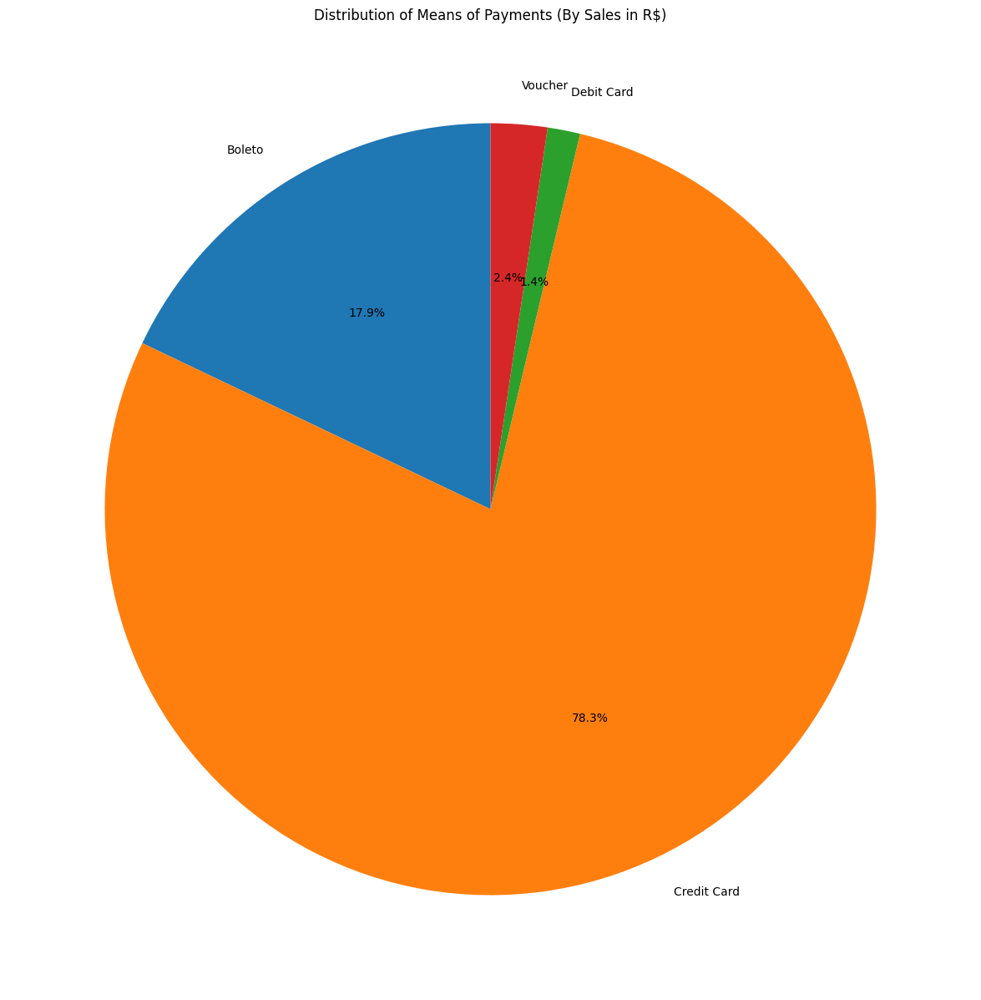

In [96]:
plt.figure(figsize=(15,15))
plt.pie(
    df['sales_by_type_of_payment'],
    labels=df['payment_type'],
    autopct='%1.1f%%',
    startangle=90
)
plt.title('Distribution of Means of Payments (By Sales in R$)')
plt.show()

# 5. Logistics Queries

## Q5.1: "Delays in shipping? By State"

In [97]:
q50 = '''
SELECT 
    c.customer_state AS state,
    julianday(o.order_delivered_customer_date) - julianday(o.order_purchase_timestamp) AS perceived_delivery_time_by_customers,
    julianday(o.order_delivered_carrier_date) - julianday(o.order_approved_at) AS internal_handling_time_by_company,
    julianday(o.order_delivered_customer_date) - julianday(o.order_delivered_carrier_date) AS shipping_time_by_company,
    julianday(o.order_delivered_customer_date) - julianday(o.order_approved_at) AS perceived_delivery_time_by_company,
    julianday(o.order_estimated_delivery_date) - julianday(o.order_delivered_customer_date) AS perceived_delivery_delay_by_customers
FROM orders AS o
JOIN customers AS c
  ON o.customer_id = c.customer_id
WHERE o.order_status = 'delivered';
'''

In [98]:
df = run_query(q50)

✅ Query executed successfully! Rows: 96478, Columns: 6


In [99]:
df.head(10)

,state,perceived_delivery_time_by_customers,internal_handling_time_by_company,shipping_time_by_company,perceived_delivery_time_by_company,perceived_delivery_delay_by_customers
0,SP,8.436574,2.366493,6.062650,8.429144,7.107488
1,BA,13.782037,0.462882,12.039410,12.502292,5.355729
2,GO,9.394213,0.204595,9.178113,9.382708,17.245498
3,RN,13.208750,3.745833,9.450498,13.196331,12.980069
4,SP,2.873877,0.893113,1.937824,2.830938,9.238171
5,PR,16.542245,1.699896,14.833229,16.533125,5.543113
6,RJ,9.989826,5.864988,4.116725,9.981713,11.461215
7,RS,9.818762,1.476204,6.994201,8.470405,31.410995
8,SP,18.221852,12.319352,5.895208,18.214560,6.281597
9,RJ,12.650937,1.659977,10.984618,12.644595,8.528808


In [100]:
q51 = '''
SELECT 
    c.customer_state AS state,
    ROUND(AVG(julianday(o.order_delivered_customer_date) - julianday(o.order_purchase_timestamp)), 2) AS avg_perceived_delivery_time_by_customers,
    ROUND(AVG(julianday(o.order_delivered_carrier_date) - julianday(o.order_approved_at)), 2) AS avg_internal_handling_time_by_company,
    ROUND(AVG(julianday(o.order_delivered_customer_date) - julianday(o.order_delivered_carrier_date)), 2) AS avg_shipping_time_by_company,
    ROUND(AVG(julianday(o.order_delivered_customer_date) - julianday(o.order_approved_at)), 2) AS avg_perceived_delivery_time_by_company,
    ROUND(AVG(julianday(o.order_estimated_delivery_date) - julianday(o.order_delivered_customer_date)), 2) AS avg_perceived_delivery_delay_by_customers
FROM orders AS o
JOIN customers AS c
  ON o.customer_id = c.customer_id
WHERE o.order_status = 'delivered'
GROUP BY c.customer_state
ORDER BY avg_perceived_delivery_time_by_customers DESC;
'''

In [101]:
df = run_query(q51)

✅ Query executed successfully! Rows: 27, Columns: 6


In [102]:
full_naming_states('state')

,state,avg_perceived_delivery_time_by_customers,avg_internal_handling_time_by_company,avg_shipping_time_by_company,avg_perceived_delivery_time_by_company,avg_perceived_delivery_delay_by_customers
0,Roraima,29.39,3.35,25.64,28.99,16.59
1,Amapá,27.19,2.88,23.66,26.55,19.06
2,Amazonas,26.43,2.50,23.52,26.02,18.85
3,Alagoas,24.54,2.97,21.09,24.06,8.03
4,Pará,23.77,2.98,20.29,23.26,13.39


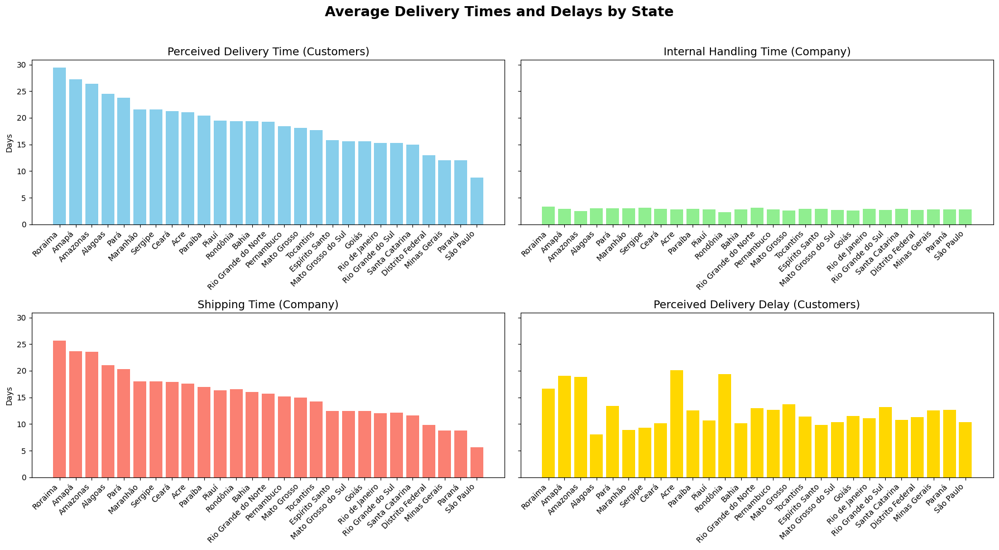

In [103]:
# Create subplots with shared Y-axis
fig, axes = plt.subplots(2, 2, figsize=(18, 10), sharey=True)
fig.suptitle("Average Delivery Times and Delays by State", fontsize=18, fontweight='bold')

# Plot 1: Perceived delivery time by customers
axes[0, 0].bar(df['state'], df['avg_perceived_delivery_time_by_customers'], color='skyblue')
axes[0, 0].set_title('Perceived Delivery Time (Customers)', fontsize=14)
axes[0, 0].set_ylabel('Days')

# Plot 2: Perceived delivery time by company
axes[0, 1].bar(df['state'], df['avg_internal_handling_time_by_company'], color='lightgreen')
axes[0, 1].set_title('Internal Handling Time (Company)', fontsize=14)

# Plot 3: Delivery delay by customers
axes[1, 0].bar(df['state'], df['avg_shipping_time_by_company'], color='salmon')
axes[1, 0].set_title('Shipping Time (Company)', fontsize=14)
axes[1, 0].set_ylabel('Days')

# Plot 4: Delivery delay by company
axes[1, 1].bar(df['state'], df['avg_perceived_delivery_delay_by_customers'], color='gold')
axes[1, 1].set_title('Perceived Delivery Delay (Customers)', fontsize=14)

# Rotate labels for readability
for ax in axes.flat:
    ax.set_xticks(range(len(df['state'])))
    ax.set_xticklabels(df['state'], rotation=45, ha='right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

- **Perceived Delivery Time (Customers):**
The total number of days the customer waits from the moment they place the order until it is delivered to their address.
It reflects the customer’s full perception of delivery speed, including the company’s internal processing time and the external shipping time.

- **Internal Handling Time (Company):**
The time it takes for Olist and the seller to approve and hand the order over to the carrier.
It represents the company’s internal efficiency in processing and dispatching orders.
  
- **Shipping Time (Company):**
The duration between when the package is handed to the carrier and when it is delivered to the customer.
It measures the external logistics performance — how long the shipment takes to reach the customer once it leaves the seller.
  
- **Perceived Delivery Delay (Customers)**:
The difference between the actual delivery time and the promised delivery time (estimated delivery date).
A positive value indicates a delay, while a negative value means the order was delivered earlier than expected.
It’s a direct measure of customer satisfaction regarding punctuality.

# 6. Trends with Queries

## Q6.1 "How many Orders have been during this period? (2016-2018)

In [104]:
q61 = '''
SELECT
    strftime('%Y', order_purchase_timestamp) AS year,
    'Q' || ((CAST(strftime('%m', order_purchase_timestamp) AS INTEGER) - 1) / 3 + 1) AS quarter,
    COUNT(order_id) AS num_orders
FROM orders
GROUP BY year, quarter
ORDER BY year, quarter;
'''

In [105]:
df = run_query(q61)

✅ Query executed successfully! Rows: 10, Columns: 3


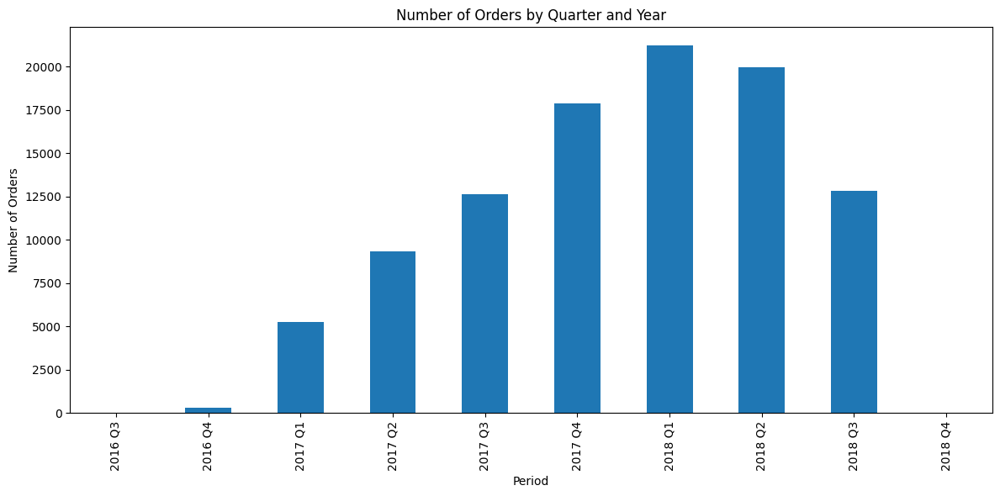

In [106]:
# Combine year and quarter for x-axis
df['period'] = df['year'] + ' ' + df['quarter']

# Group and sum orders
df_grouped = df.groupby(['period'], as_index=False)['num_orders'].sum()

# Plot
df_grouped.plot(kind='bar', x='period', y='num_orders', figsize=(12,6), legend=False)
plt.title('Number of Orders by Quarter and Year')
plt.xlabel('Period')
plt.ylabel('Number of Orders')
plt.tight_layout()
plt.show()

## Q6.2: "Order distribution by status? (by Year)"

In [107]:
q62 = '''
SELECT
    strftime('%Y', order_purchase_timestamp) AS year,
    'Q' || ((CAST(strftime('%m', order_purchase_timestamp) AS INTEGER) - 1) / 3 + 1) AS quarter,
    CASE 
        WHEN order_status = 'delivered' THEN 'delivered'
        ELSE 'non delivered'
    END AS order_status,
    COUNT(order_id) AS num_orders
FROM orders
GROUP BY year, quarter, order_status
ORDER BY year, quarter, order_status;
'''

In [108]:
df = run_query(q62)

✅ Query executed successfully! Rows: 56, Columns: 4


In [109]:
titling('order_status')

,year,quarter,order_status,num_orders
0,2016,Q3,Delivered,1
1,2016,Q3,Non Delivered,2
2,2016,Q3,Non Delivered,1
3,2016,Q4,Delivered,266
4,2016,Q4,Non Delivered,24


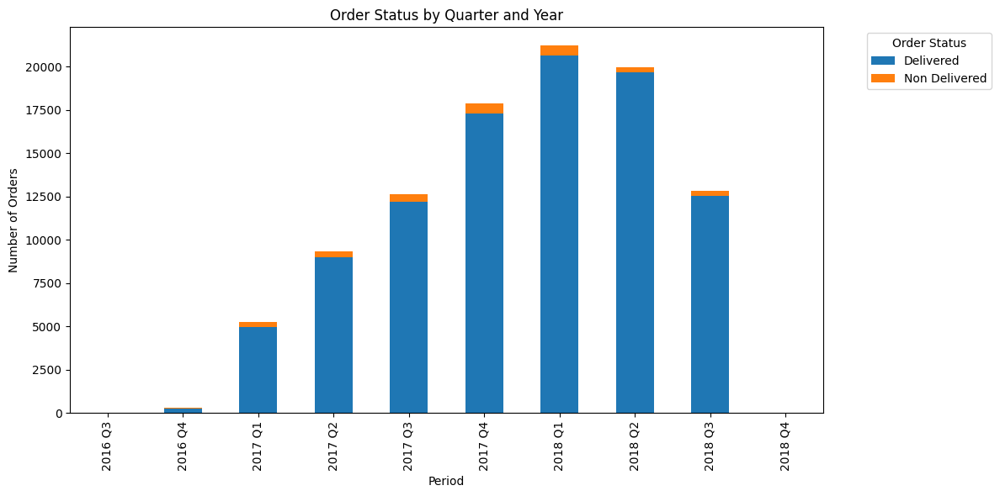

In [110]:
# Combine year and quarter for x-axis
df['period'] = df['year'] + ' ' + df['quarter']

# Aggregate to remove duplicate (period, order_status) combinations
df_grouped = (
    df.groupby(['period', 'order_status'], as_index=False)['num_orders']
      .sum()
)

# Pivot for better visualization
pivot = df_grouped.pivot(index='period', columns='order_status', values='num_orders').fillna(0)

# Plot
pivot.plot(kind='bar', stacked=True, figsize=(12,6))
plt.title('Order Status by Quarter and Year')
plt.xlabel('Period')
plt.ylabel('Number of Orders')
plt.legend(title='Order Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Q6.3: "How many sales have been during this period? (2016-2018)

In [111]:
q63 = '''
SELECT
    strftime('%Y', order_purchase_timestamp) AS year,
    'Q' || ((CAST(strftime('%m', order_purchase_timestamp) AS INTEGER) - 1) / 3 + 1) AS quarter,
    SUM(op.payment_value) AS sales
FROM orders AS o
JOIN order_payments AS op
    ON o.order_id = op.order_id
GROUP BY year, quarter
ORDER BY year, quarter;
'''

In [112]:
df = run_query(q63)

✅ Query executed successfully! Rows: 10, Columns: 3


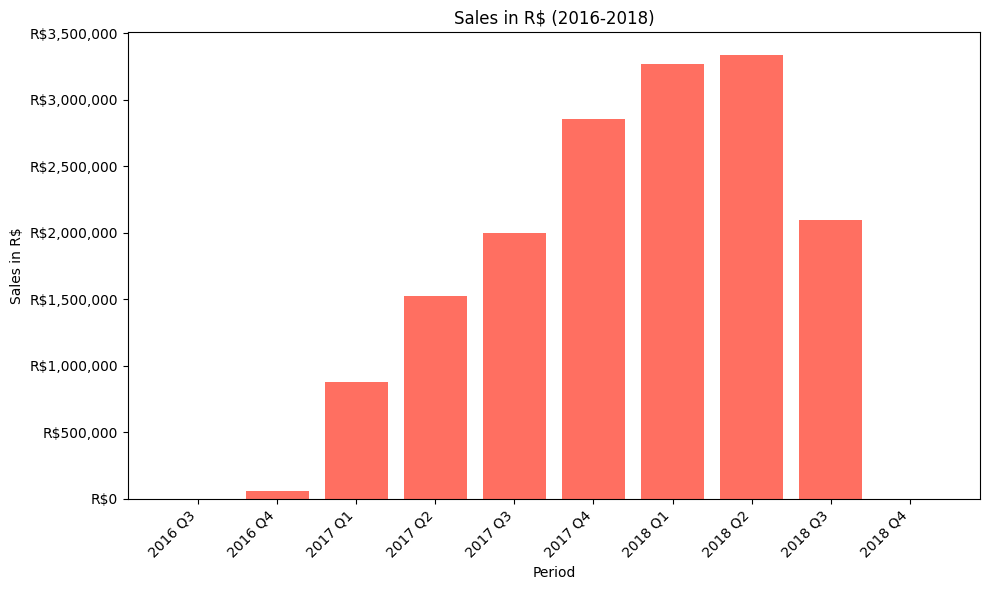

In [113]:
# Combine year and quarter for x-axis
df['period'] = df['year'] + ' ' + df['quarter']

#Plot
plt.figure(figsize=(10, 6))
plt.bar(df["period"], df["sales"], color="#FF6F61")
plt.xlabel("Period")
plt.ylabel("Sales in R$")
plt.title("Sales in R$ (2016-2018)")
plt.xticks(rotation=45, ha='right')

plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter("R${x:,.0f}"))

plt.tight_layout()
plt.show()

# Conclusions

- **Customer Experience & Delivery Times**

The average perceived delivery time by customers was notably longer than the company’s internal handling time, suggesting logistics and last-mile delivery are the main contributors to delays.

Customers from the South and Southeast regions (São Paulo, Rio de Janeiro, Paraná) generally experienced faster deliveries, while North and Northeast states had longer delivery periods — consistent with Brazil’s infrastructure and geographic challenges.

- **Sales & Product Insights**

The majority of orders belong to a few popular product categories such as health & beauty, watches & gifts, and furniture décor.

However, there’s a long tail of low-volume categories, meaning Olist benefits from offering a wide range of niche products.

- **Payments & Revenue**

The total payment value exceeded total product prices by several million BRL, which can be explained by freight charges, installment interest, and additional service fees.

Most customers used credit cards with installments, highlighting a strong dependence on deferred payment methods in Brazil’s e-commerce market.

- **Customer Behavio**

A large share of customers made only one purchase, indicating low customer retention and emphasizing the importance of marketing or loyalty programs.

A small group of repeat buyers contributes disproportionately to total revenue.

- **Seller Performance**

Some sellers have exceptionally high order volumes, while most handle only a few orders — suggesting a concentrated marketplace where top sellers dominate visibility.

Delivery performance varies between sellers, pointing to opportunities for better performance monitoring and standardization.

- **Business Opportunities / Ideas / Suggestions**

Investing in logistics partnerships, regional warehouses, or predictive shipping models could reduce delivery delays.

Customer segmentation and retention strategies (e.g., reward programs) could significantly improve lifetime value.

Expanding fast-selling product lines while analyzing underperforming categories can optimize inventory and improve profitability.

# Limitations

- **Limited Time Frame**

The dataset covers transactions from 2016 to 2018, which restricts the ability to identify long-term trends or seasonal patterns beyond that period. E-commerce dynamics may have changed significantly since then.

- **Lack of External Context**

The data does not include macroeconomic indicators, marketing activities, or competitor behavior, all of which could have influenced sales and delivery performance during the analyzed period.

- **Anonymized and Aggregated Data**

Customer and seller identifiers are anonymized, preventing deeper segmentation (e.g., by demographics, company size, or customer loyalty level).
This limits the possibility of building personalized insights or predictive models based on real user profiles.

- **Incomplete or Missing Fields**

Some orders contain missing dates or inconsistent delivery timestamps, which can slightly distort average delivery time or handling time calculations, even after cleaning.

- **Simplified Financial Metrics**

The dataset includes price and payment values, but not explicit details about freight costs, installment interest, or commissions, which complicates accurate profit margin estimation.

- **Static Snapshot of Operations**

Since the dataset represents a historical snapshot rather than a live system, it’s impossible to measure real-time performance improvements or simulate operational changes.